# Problem Statement 

**Hospitals generate large amounts of structured data from patient visits, admissions, and billing transactions.
While most records follow expected clinical and financial patterns, some may represent anomalies such as incorrect charges, 
fraudulent claims, unusual patient–diagnosis mismatches, or abnormal physician billing behavior**.

### Data Description

| Column Name              | Description                                                                        | Example Values                            |
| ------------------------ | ---------------------------------------------------------------------------------- | ----------------------------------------- |
| **patient\_id**          | Unique identifier assigned to each patient.                                        | `P12345`                                  |
| **gender**               | Gender of the patient.                                                             | `Male`, `Female`, `Other`                 |
| **age**                  | Age of the patient (in years).                                                     | `35`, `62`                                |
| **visit\_date**          | Date when the patient visited the hospital/clinic.                                 | `2023-07-14`                              |
| **department**           | Hospital department where the patient was seen.                                    | `Cardiology`, `Oncology`, `Emergency`     |
| **physician\_id**        | Unique identifier for the attending physician.                                     | `DR4567`                                  |
| **diagnosis**            | Primary diagnosis assigned during the visit (ICD code or text).                    | `Hypertension`, `Diabetes Mellitus`       |
| **visit\_type**          | Type of visit.                                                                     | `Outpatient`, `Inpatient`, `Emergency`    |
| **visit\_reason**        | Reason for the visit as stated by the patient or recorded.                         | `Chest pain`, `Routine checkup`           |
| **appointment\_id**      | Unique identifier for the appointment (helps detect duplicate or multiple claims). | `A78901`                                  |
| **is\_emergency**        | Indicates if the visit was marked as an emergency.                                 | `Yes/No` or `1/0`                         |
| **insurance\_id**        | Unique identifier of the patient’s insurance provider.                             | `INS8765`                                 |
| **payer\_name**          | Name of the payer/insurance company responsible for covering charges.              | `Medicare`, `BlueCross`, `Private`        |
| **payer\_type**          | Type of payer (public, private, self-pay, government).                             | `Private`, `Government`, `Self`           |
| **claim\_status**        | Current status of the insurance claim.                                             | `Pending`, `Approved`, `Rejected`, `Paid` |
| **charge\_amount\_USD**  | Total charges billed for the visit (in US Dollars).                                | `500.00`, `3500.75`                       |
| **payment\_amount\_USD** | Actual payment received from payer/patient (in US Dollars).                        | `450.00`, `0.00`                          |
| **admission\_date**      | Date of hospital admission (for inpatients).                                       | `2023-07-12`                              |
| **discharge\_date**      | Date of hospital discharge (for inpatients).                                       | `2023-07-15`                              |


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings 
warnings.filterwarnings("ignore")

In [5]:
df=pd.read_csv('Hospital_billing.csv')
df.head()

,patient_id,gender,age,visit_date,department,physician_id,diagnosis,visit_type,visit_reason,appointment_id,is_emergency,insurance_id,payer_name,payer_type,claim_status,charge_amount_USD,payment_amount_USD,admission_date,discharge_date
0,154669,Male,43,05-11-2024,Cardiology,30927,Hypertension,Outpatient,NaN,A00000,Yes,INS-MMIAPD,Flores-Allen,Government,Submitted,247,0,NaN,NaN
1,144776,Female,56,15-12-2024,Cardiology,14816,Hypertension,Outpatient,Chest Pain,A00001,No,INS-M2HVS3,"Anderson, Oconnell and Yates",Insurance,Approved,296,0,NaN,NaN
2,217503,Male,49,02-01-2024,Orthopedics,73819,Back Pain,Inpatient,Surgery Follow-up,A00002,No,INS-GMOCQU,Jackson-Hubbard,Government,Denied,1240,992,02-01-2024,26-01-2024
3,174851,Male,8,29-06-2024,Pediatrics,81325,Asthma,Outpatient,Fever,A00003,No,NaN,Self-pay,Self-pay,Paid,43,43,NaN,NaN
4,193134,Female,39,21-11-2024,Cardiology,10046,Heart Failure,Outpatient,Chest Pain,A00004,Yes,NaN,Gonzalez Group,Insurance,Approved,219,0,NaN,NaN


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6000 entries, 0 to 5999
Data columns (total 19 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   patient_id          6000 non-null   int64 
 1   gender              6000 non-null   object
 2   age                 6000 non-null   int64 
 3   visit_date          6000 non-null   object
 4   department          6000 non-null   object
 5   physician_id        6000 non-null   int64 
 6   diagnosis           5576 non-null   object
 7   visit_type          6000 non-null   object
 8   visit_reason        5601 non-null   object
 9   appointment_id      6000 non-null   object
 10  is_emergency        6000 non-null   object
 11  insurance_id        3697 non-null   object
 12  payer_name          5598 non-null   object
 13  payer_type          6000 non-null   object
 14  claim_status        6000 non-null   object
 15  charge_amount_USD   6000 non-null   int64 
 16  payment_amount_USD  6000

In [7]:
df.isna().sum()

patient_id               0
gender                   0
age                      0
visit_date               0
department               0
physician_id             0
diagnosis              424
visit_type               0
visit_reason           399
appointment_id           0
is_emergency             0
insurance_id          2303
payer_name             402
payer_type               0
claim_status             0
charge_amount_USD        0
payment_amount_USD       0
admission_date        2988
discharge_date        2988
dtype: int64

In [8]:
## The columns  diagnosis , visit_reason  , payer_name admission_date discharge_date , will be impute with the mode 
## The columns insurance_id  of missing value will be impute with the 'missing'

In [9]:
# Columns to impute with mode
mode_cols = ["diagnosis", "visit_reason", "payer_name", "admission_date", "discharge_date"]

for col in mode_cols:
    df[col].fillna(df[col].mode()[0], inplace=True)

# Impute insurance_id with "missing"
df["insurance_id"].fillna("missing", inplace=True)


In [10]:
df.isna().sum()

patient_id            0
gender                0
age                   0
visit_date            0
department            0
physician_id          0
diagnosis             0
visit_type            0
visit_reason          0
appointment_id        0
is_emergency          0
insurance_id          0
payer_name            0
payer_type            0
claim_status          0
charge_amount_USD     0
payment_amount_USD    0
admission_date        0
discharge_date        0
dtype: int64

In [11]:
df.describe()

,patient_id,age,physician_id,charge_amount_USD,payment_amount_USD
count,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000
mean,165320.868833,37.539333,54477.194833,349.127000,142.259333
std,31664.496141,20.092670,25957.515724,625.756656,502.622747
min,110015.000000,1.000000,10002.000000,40.000000,0.000000
25%,137784.000000,19.000000,31694.250000,131.750000,0.000000
50%,165830.500000,40.000000,54671.500000,177.000000,0.000000
75%,192591.250000,54.000000,76971.500000,282.000000,141.000000
max,219998.000000,80.000000,99954.000000,11940.000000,9552.000000


In [12]:
df['admission_date'] = pd.to_datetime(df['admission_date'],format='%d-%m-%Y')
df['discharge_date'] = pd.to_datetime(df['discharge_date'],format='%d-%m-%Y')
df['visit_date'] = pd.to_datetime(df['visit_date'],format='%d-%m-%Y')

**In this dataset we consider as the Hospital side as billing Anomaly detection so we try understand the datset with the charge_amount_USD and start find the analysis**


## Unvivariate analysis 

In [15]:
cate=df.select_dtypes(include=['object','category']).columns
cate

Index(['gender', 'department', 'diagnosis', 'visit_type', 'visit_reason',
       'appointment_id', 'is_emergency', 'insurance_id', 'payer_name',
       'payer_type', 'claim_status'],
      dtype='object')

In [16]:
num=df.select_dtypes(include=['int64','float']).columns
num


Index(['patient_id', 'age', 'physician_id', 'charge_amount_USD',
       'payment_amount_USD'],
      dtype='object')

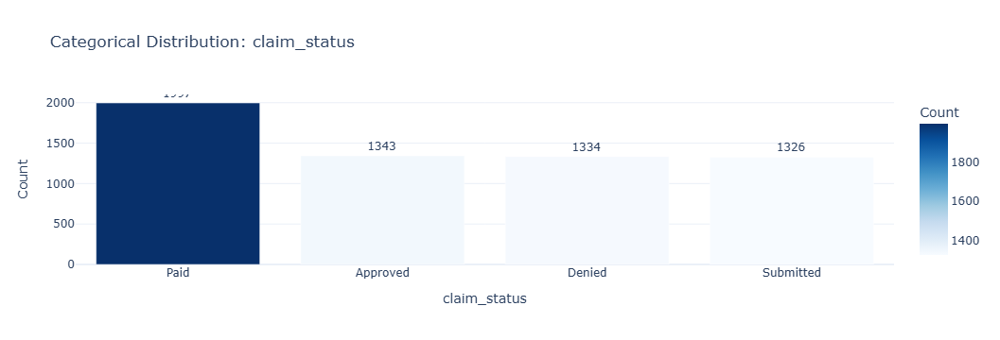

In [17]:
import plotly.express as px
import plotly.graph_objects as go
from scipy.stats import gaussian_kde
import numpy as np

def univariate_analysis_plotly(df):
    categorical_cols = ['gender', 'department', 'diagnosis', 'visit_type', 'visit_reason',
                        'is_emergency', 'payer_name', 'payer_type', 'claim_status']
    numerical_cols = ['age', 'charge_amount_USD', 'payment_amount_USD']

    # --- Categorical Variables ---
    for col in categorical_cols:
        value_counts = df[col].value_counts(dropna=False).head(15).reset_index()
        value_counts.columns = [col, "Count"]

        fig = px.bar(
            value_counts,
            x=col,
            y="Count",
            text="Count",
            title=f"Categorical Distribution: {col}",
            color="Count",
            color_continuous_scale="Blues"
        )
        fig.update_traces(texttemplate='%{text}', textposition='outside')
        fig.update_layout(
            xaxis_title=col,
            yaxis_title="Count",
            template="plotly_white",
            uniformtext_minsize=8,
            uniformtext_mode='hide'
        )
        fig.show()

    # --- Numerical Variables ---
    for col in numerical_cols:
        x_vals = df[col].dropna().values
        kde = gaussian_kde(x_vals)
        x_range = np.linspace(x_vals.min(), x_vals.max(), 200)

        fig = px.histogram(
            df,
            x=col,
            nbins=20,
            marginal="box",
            histnorm="probability density",
            opacity=0.6,
            title=f"Numerical Distribution with KDE: {col}",
            color_discrete_sequence=["#636EFA"]
        )
        fig.add_trace(go.Scatter(
            x=x_range,
            y=kde(x_range),
            mode="lines",
            line=dict(color="red", width=2),
            name="KDE"
        ))
        fig.update_layout(
            xaxis_title=col,
            yaxis_title="Density",
            template="plotly_white"
        )
        fig.show()

# Run analysis
univariate_analysis_plotly(df)

**Key Findings**

- The age distribution is multimodal and slightly right-skewed, with a strong concentration in the 20–50 years range.

- Arrhythmia emerges as the most frequently diagnosed condition. 

- Follow-up visits account for over 1,000 recorded visit reasons.

- A majority of patients fall under the self-pay category.

- The distribution of Charge Amount (USD) is right-skewed, mirroring the pattern observed in Payer Amount (USD).

## Bi-Variate Analysis 
**Our Intrest in finding the anomalies in the hospital billings so we consider the charge_amount_usd is base attribute**

In [20]:
categorical = df[['gender', 'department', 'diagnosis', 'visit_type', 'visit_reason', 'is_emergency',  'payer_name', 'payer_type', 'claim_status']] 
numerical = df[['age','charge_amount_USD','payment_amount_USD']]

In [21]:
categorical

,gender,department,diagnosis,visit_type,visit_reason,is_emergency,payer_name,payer_type,claim_status
0,Male,Cardiology,Hypertension,Outpatient,Follow-up,Yes,Flores-Allen,Government,Submitted
1,Female,Cardiology,Hypertension,Outpatient,Chest Pain,No,"Anderson, Oconnell and Yates",Insurance,Approved
2,Male,Orthopedics,Back Pain,Inpatient,Surgery Follow-up,No,Jackson-Hubbard,Government,Denied
3,Male,Pediatrics,Asthma,Outpatient,Fever,No,Self-pay,Self-pay,Paid
4,Female,Cardiology,Heart Failure,Outpatient,Chest Pain,Yes,Gonzalez Group,Insurance,Approved
...,...,...,...,...,...,...,...,...,...
5995,Male,Pediatrics,Infection,Inpatient,Fever,No,Merritt-Flynn,Government,Denied
5996,Male,Pediatrics,Asthma,Outpatient,Follow-up,Yes,Self-pay,Self-pay,Paid
5997,Female,Orthopedics,Back Pain,Outpatient,Follow-up,Yes,Self-pay,Self-pay,Paid
5998,Male,Neurology,Epilepsy,Outpatient,Headache,No,"Smith, Cole and Rodgers",Insurance,Approved


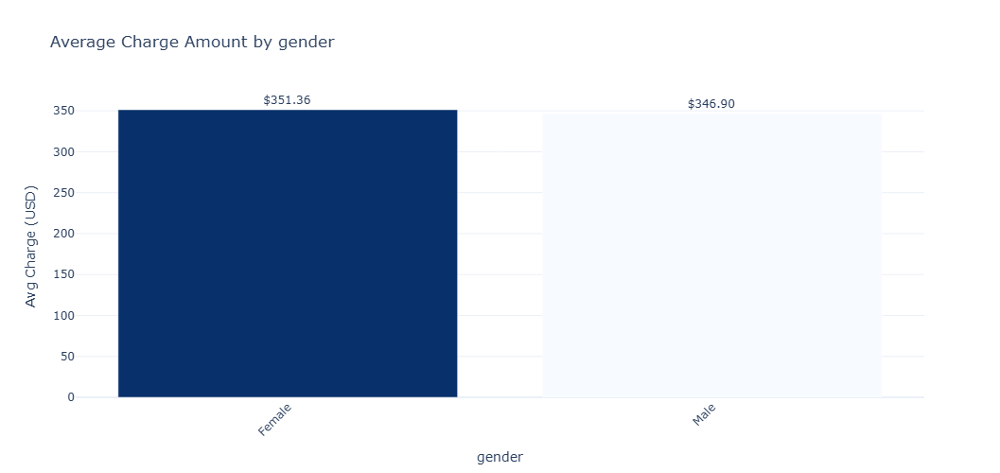

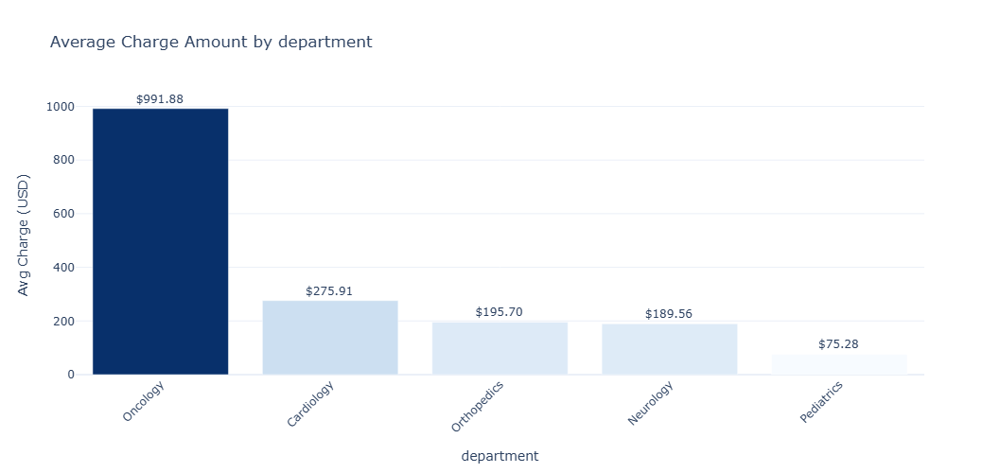

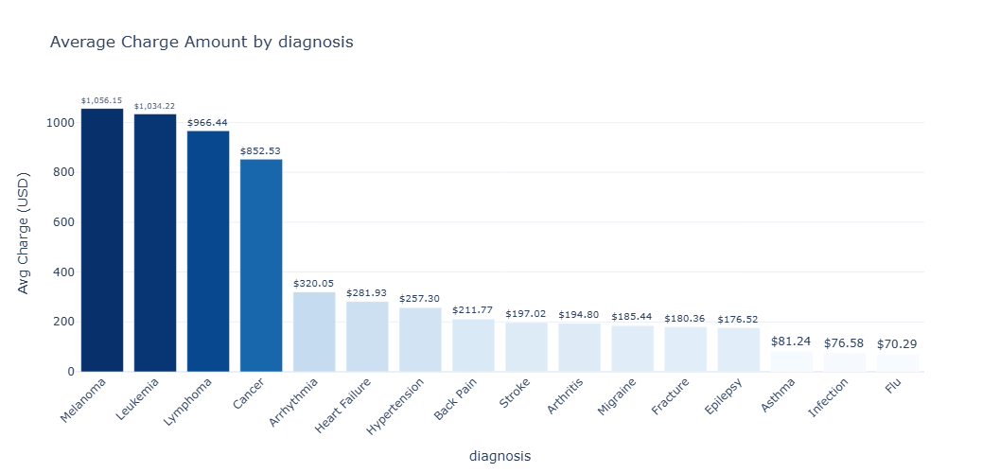

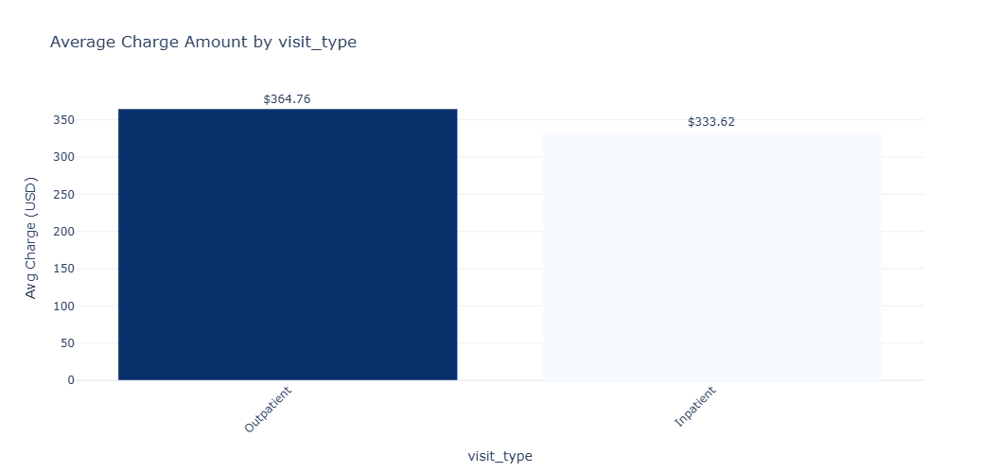

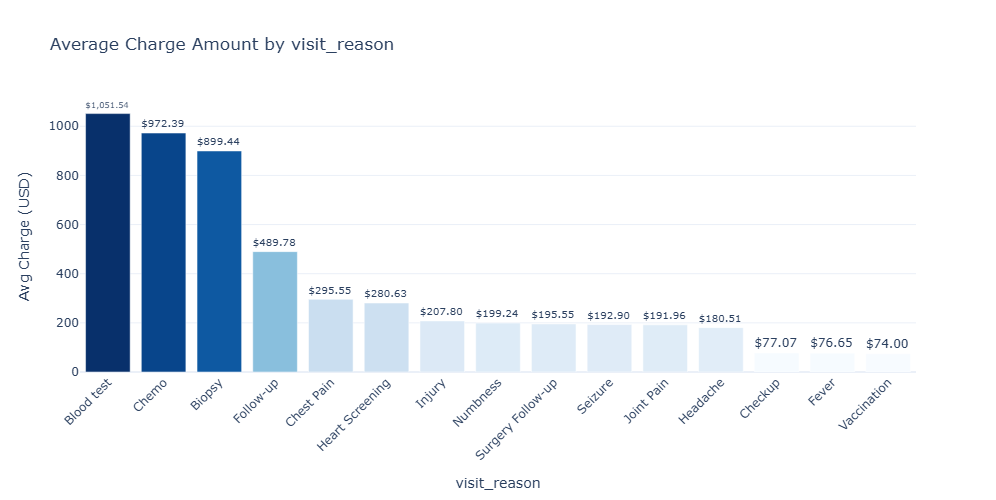

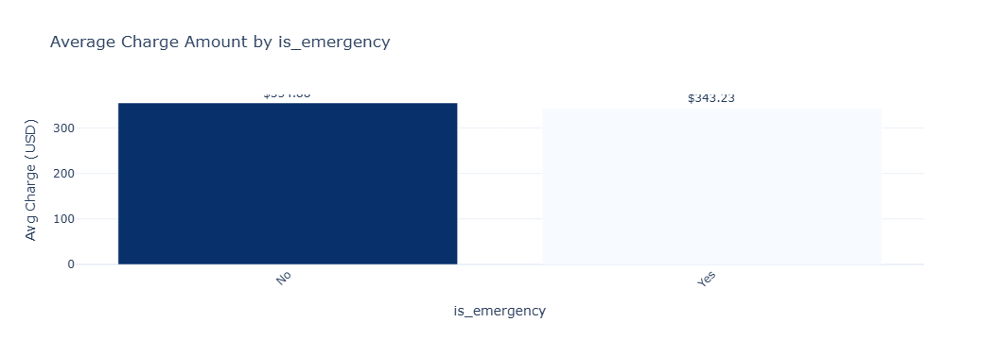

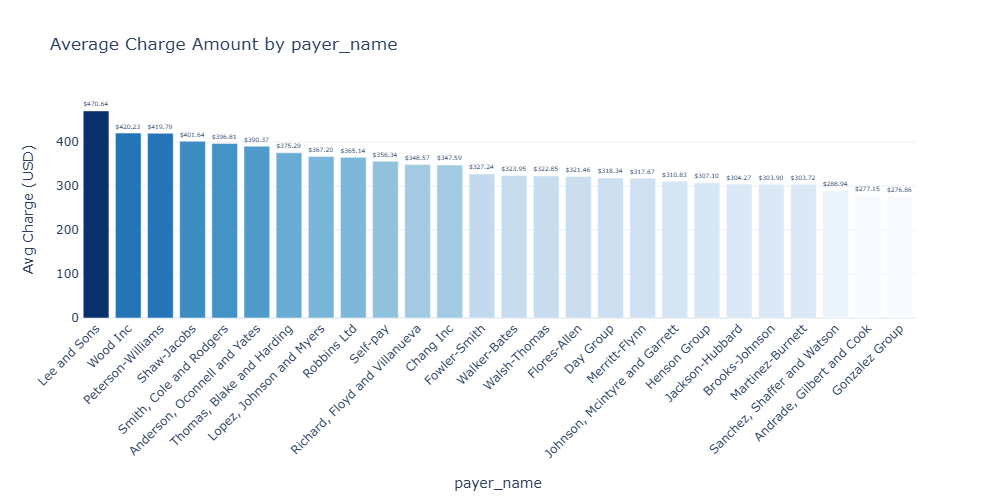

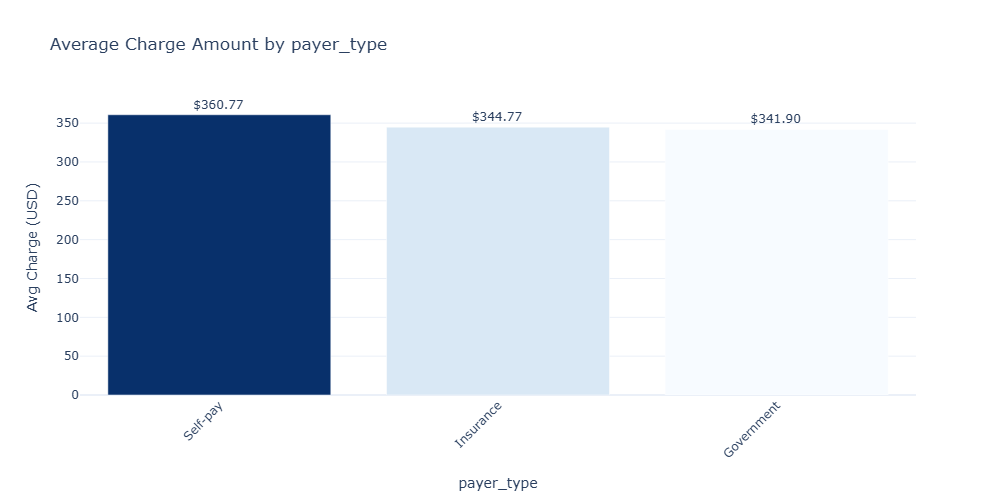

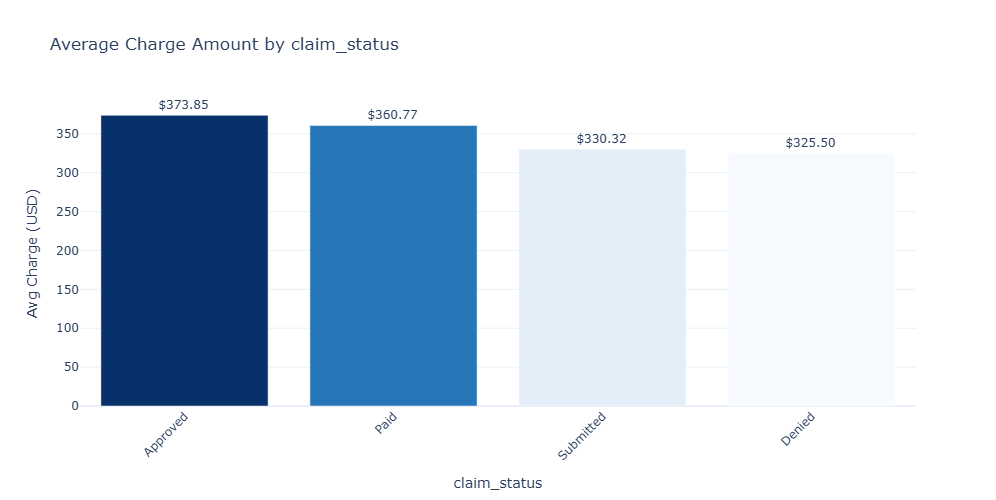

In [56]:
for col in categorical:
    avg_charges = (
        df.groupby(col)['charge_amount_USD']
        .mean()
        .sort_values(ascending=False)
        .reset_index()
    )
    avg_charges.columns = [col, 'avg_charge_USD']

    fig = px.bar(
        avg_charges,
        x=col,
        y='avg_charge_USD',
        title=f'Average Charge Amount by {col}',
        text=avg_charges['avg_charge_USD'].round(2),
        color='avg_charge_USD',
        color_continuous_scale='Blues'
    )
    fig.update_traces(texttemplate='$%{text:,.2f}', textposition='outside')
    fig.update_layout(
        xaxis_title=col,
        yaxis_title='Avg Charge (USD)',
        template='plotly_white',
        coloraxis_showscale=False,
        xaxis_tickangle=-45,
        height=500
    )
    fig.show()

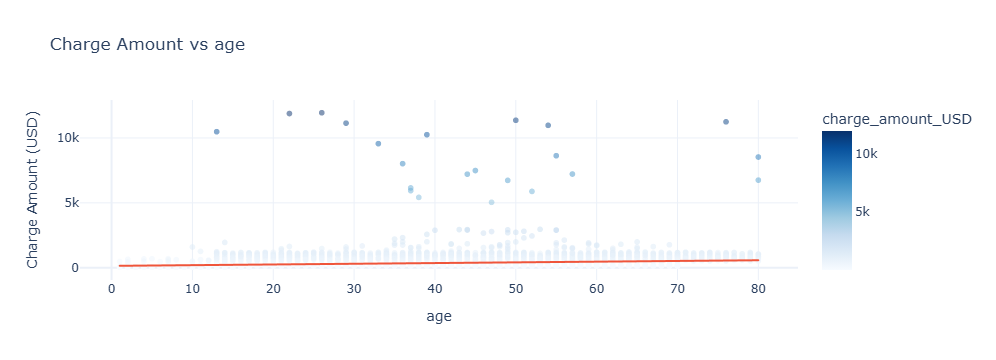

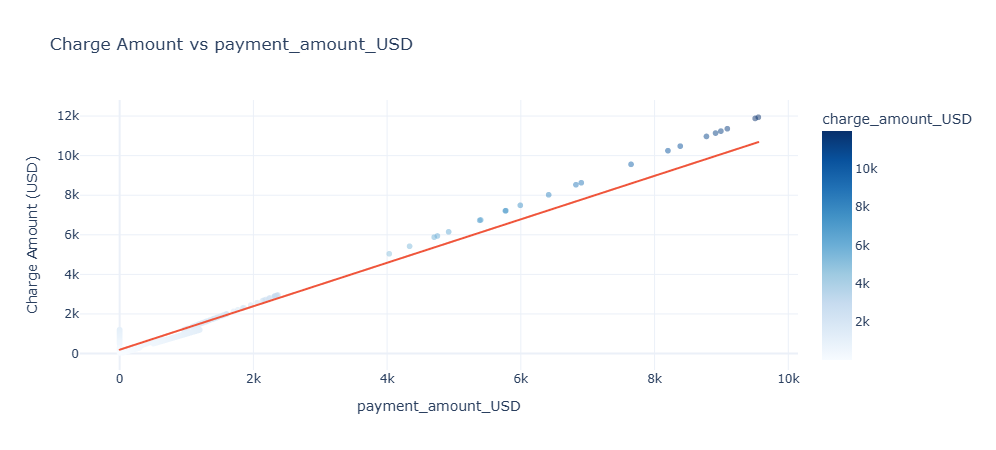

In [58]:
import plotly.express as px

for col in ['age', 'payment_amount_USD']:
    fig = px.scatter(
        df,
        x=col,
        y='charge_amount_USD',
        title=f'Charge Amount vs {col}',
        opacity=0.5,
        color='charge_amount_USD',
        color_continuous_scale='Blues',
        trendline='ols'
    )
    fig.update_layout(
        xaxis_title=col,
        yaxis_title='Charge Amount (USD)',
        template='plotly_white',
        height=450
    )
    fig.show()

**Important Insights on Charge Amount** 

- Oncology have the significance higher average charge amount
- Patients diagnosed with Melanoma, Leukemia, Lymphoma, and Cancer incur the highest average charges, exceeding $850–$1000.
- Patients visiting for Blood Tests, Chemotherapy, and Biopsies incur the highest average charges (around $900–$1,050).

**Before conducting Multivariate Analysis, an ANOVA test will be performed to identify significant relationships among the existing features.**

In [62]:
from scipy import stats

target = "charge_amount_USD"

categorical_cols = df[['gender', 'department', 'diagnosis', 'visit_type', 'visit_reason', 'is_emergency',  'payer_name','payer_type', 'claim_status']]
numeric_cols = df[[ 'age','payment_amount_USD']]

results = []

# ANOVA for categorical features
for col in categorical_cols:
    groups = [group[target].values 
              for name, group in df.groupby(col) if len(group) > 1]
    
    if len(groups) > 1:
        f_stat, p_val = stats.f_oneway(*groups)
        results.append((col, "Categorical", f_stat, p_val))

# Correlation for numeric features
for col in numeric_cols:
    corr, p_val = stats.pearsonr(df[col], df[target])
    results.append((col, "Numeric", corr, p_val))

# Create results DataFrame
anova_corr_results = pd.DataFrame(results, columns=["Feature", "Type", "Statistic", "p-value"])
anova_corr_results["Significant (p<0.05)"] = anova_corr_results["p-value"] < 0.05

# Sort by p-value (strongest relationships first)
anova_corr_results = anova_corr_results.sort_values("p-value")

(anova_corr_results)

,Feature,Type,Statistic,p-value,Significant (p<0.05)
1,department,Categorical,578.329262,0.000000e+00,True
2,diagnosis,Categorical,138.740947,0.000000e+00,True
10,payment_amount_USD,Numeric,0.882192,0.000000e+00,True
4,visit_reason,Categorical,112.983596,1.416678e-291,True
9,age,Numeric,0.173537,8.809441e-42,True
3,visit_type,Categorical,3.714243,5.399726e-02,False
8,claim_status,Categorical,1.963188,1.172309e-01,False
5,is_emergency,Categorical,0.519676,4.710080e-01,False
6,payer_name,Categorical,0.947715,5.372505e-01,False
7,payer_type,Categorical,0.528685,5.894067e-01,False


Note : In business terminial we have to consider all columns and then perform the anomaly detection but current we have less confidence to build isolation forest on the all feature because we don't will this work correctly or not and no evaluation metric how to build now ?

In [65]:
cate=df.select_dtypes(include=['object','category']).columns
cate

Index(['gender', 'department', 'diagnosis', 'visit_type', 'visit_reason',
       'appointment_id', 'is_emergency', 'insurance_id', 'payer_name',
       'payer_type', 'claim_status'],
      dtype='object')

In [67]:
Num=df.select_dtypes(include=['int64','float']).columns
Num

Index(['patient_id', 'age', 'physician_id', 'charge_amount_USD',
       'payment_amount_USD'],
      dtype='object')

In [69]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import mutual_info_regression
from sklearn.preprocessing import LabelEncoder

# Assuming df is your dataframe and charge_amount_USD is the target
target = 'charge_amount_USD'

# Define categorical and numeric columns
categorical_cols = ['gender', 'department', 'diagnosis', 'visit_type', 
                    'visit_reason', 'is_emergency', 'payer_name', 
                    'payer_type', 'claim_status']

numeric_cols = ['age', 'payment_amount_USD']  # exclude target

# --- Mutual Information for Categorical vs Numeric target ---
mi_scores = {}
for col in categorical_cols:
    le = LabelEncoder()
    encoded = le.fit_transform(df[col].astype(str))  # encode categorical
    mi = mutual_info_regression(encoded.reshape(-1,1), df[target], random_state=42)
    mi_scores[col] = mi[0]

# --- Correlation for Numeric vs Numeric target ---
corr_scores = {}
for col in numeric_cols:
    corr = df[col].corr(df[target], method='spearman')  # spearman handles monotonic
    corr_scores[col] = abs(corr)

# Combine results into single dataframe
feature_importance = pd.DataFrame({
    "Feature": list(mi_scores.keys()) + list(corr_scores.keys()),
    "Score": list(mi_scores.values()) + list(corr_scores.values())
}).sort_values(by="Score", ascending=False).reset_index(drop=True)

print(feature_importance)


               Feature     Score
0           department  1.167023
1            diagnosis  1.019347
2         visit_reason  0.955158
3                  age  0.486870
4   payment_amount_USD  0.193955
5         claim_status  0.003812
6         is_emergency  0.002141
7           visit_type  0.000902
8               gender  0.000000
9           payer_name  0.000000
10          payer_type  0.000000


**Since we are performing anomaly detection at the hospital level, we consider the following attributes:**

- department

- diagnosis

- visit_reason

- age

- is_emergency

- payment_amount_USD

- claim_status (optional)

- visit_type (optional)

- gender (optional)

- charge_amount_USD

## Multivariate Analysis


**Numberic Attribute**

<IPython.core.display.Javascript object>

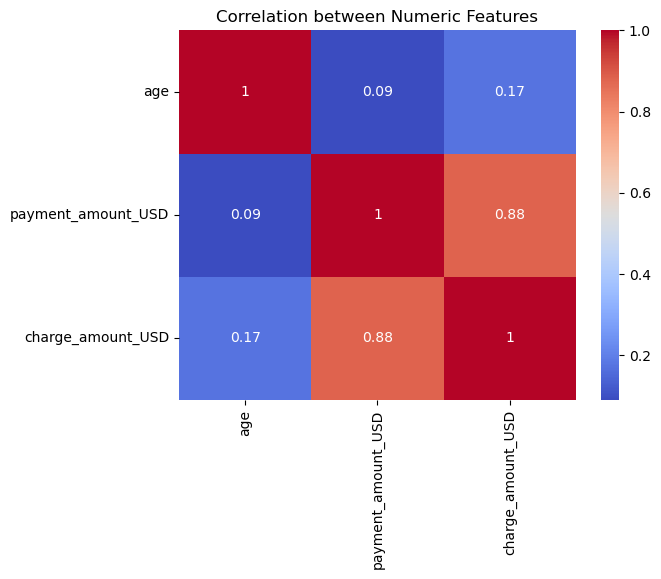

In [74]:
numeric_cols = ['age', 'payment_amount_USD', 'charge_amount_USD']
sns.heatmap(df[numeric_cols].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation between Numeric Features')
plt.show()


cluster
0    2342
1    1689
2    1135
3     834
Name: count, dtype: int64


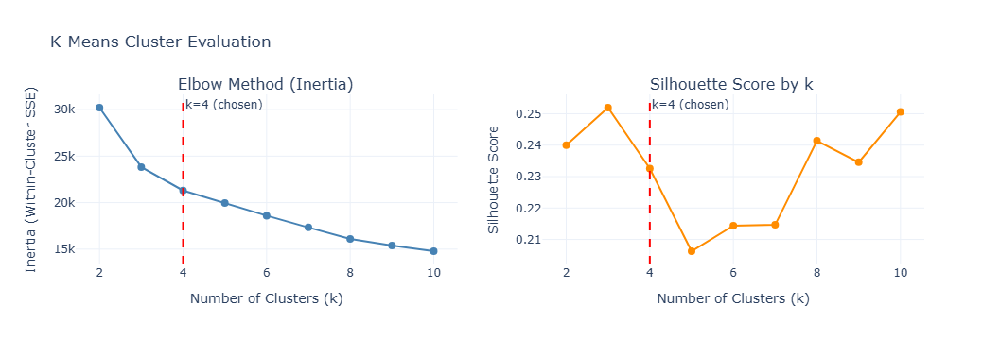

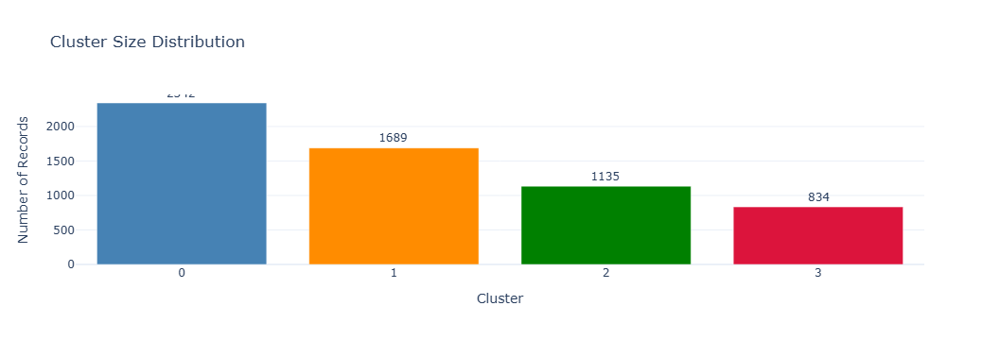

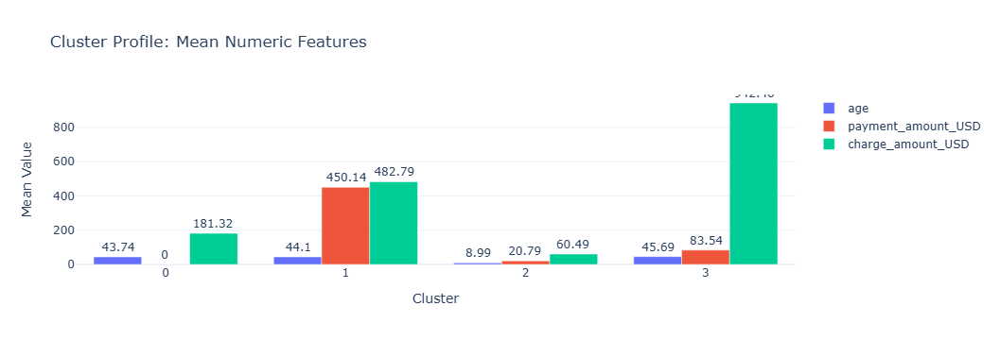

In [76]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import OneHotEncoder, StandardScaler, PowerTransformer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import plotly.graph_objects as go
from plotly.subplots import make_subplots

categorical_cols = [
    "department", "diagnosis",
    "visit_reason", "claim_status"
]
numeric_cols = ["age", "payment_amount_USD", "charge_amount_USD"]

categorical_transformer = OneHotEncoder(handle_unknown="ignore", sparse_output=False)
numeric_transformer = Pipeline(steps=[
    ("power", PowerTransformer(method="yeo-johnson")),
    ("scaler", StandardScaler())
])

preprocessor = ColumnTransformer(
    transformers=[
        ("categorical", categorical_transformer, categorical_cols),
        ("numeric", numeric_transformer, numeric_cols)
    ]
)

# -----------------------------------
# Build Final Pipeline
# -----------------------------------
pipeline = Pipeline(steps=[
    ("preprocessor", preprocessor),
    ("cluster", KMeans(n_clusters=4, init="k-means++", n_init=10, random_state=42))
])

# -----------------------------------
# Fit Model
# -----------------------------------
labels = pipeline.fit_predict(df)
df["cluster"] = labels.astype(str)  # string so Plotly treats as discrete color
print(df["cluster"].value_counts())

# -----------------------------------
# Elbow Plot + Silhouette Score
# -----------------------------------
X_preprocessed = preprocessor.fit_transform(df)

inertias = []
silhouette_scores = []
k_range = list(range(2, 11))

for k in k_range:
    km = KMeans(n_clusters=k, init="k-means++", n_init=10, random_state=42)
    km.fit(X_preprocessed)
    inertias.append(km.inertia_)
    silhouette_scores.append(silhouette_score(X_preprocessed, km.labels_))

# --- Combined Elbow + Silhouette Plot ---
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("Elbow Method (Inertia)", "Silhouette Score by k")
)

# Elbow curve
fig.add_trace(
    go.Scatter(
        x=k_range, y=inertias,
        mode="lines+markers",
        name="Inertia",
        marker=dict(color="steelblue", size=8),
        line=dict(color="steelblue", width=2)
    ),
    row=1, col=1
)
fig.add_vline(
    x=4, line_dash="dash", line_color="red",
    annotation_text="k=4 (chosen)", annotation_position="top right",
    row=1, col=1
)

# Silhouette scores
fig.add_trace(
    go.Scatter(
        x=k_range, y=silhouette_scores,
        mode="lines+markers",
        name="Silhouette Score",
        marker=dict(color="darkorange", size=8),
        line=dict(color="darkorange", width=2)
    ),
    row=1, col=2
)
fig.add_vline(
    x=4, line_dash="dash", line_color="red",
    annotation_text="k=4 (chosen)", annotation_position="top right",
    row=1, col=2
)

fig.update_xaxes(title_text="Number of Clusters (k)")
fig.update_yaxes(title_text="Inertia (Within-Cluster SSE)", row=1, col=1)
fig.update_yaxes(title_text="Silhouette Score", row=1, col=2)
fig.update_layout(
    title="K-Means Cluster Evaluation",
    template="plotly_white",
    height=450,
    showlegend=False
)
fig.show()

# -----------------------------------
# Cluster Size Bar Chart
# -----------------------------------
cluster_counts = df["cluster"].value_counts().reset_index()
cluster_counts.columns = ["cluster", "count"]

fig2 = go.Figure(go.Bar(
    x=cluster_counts["cluster"],
    y=cluster_counts["count"],
    text=cluster_counts["count"],
    textposition="outside",
    marker_color=["steelblue", "darkorange", "green", "crimson"]
))
fig2.update_layout(
    title="Cluster Size Distribution",
    xaxis_title="Cluster",
    yaxis_title="Number of Records",
    template="plotly_white",
    height=400
)
fig2.show()

# -----------------------------------
# Cluster Profile: Numeric Means
# -----------------------------------
cluster_profile = df.groupby("cluster")[numeric_cols].mean().reset_index()

fig3 = go.Figure()
colors = ["steelblue", "darkorange", "green", "crimson"]

for i, col in enumerate(numeric_cols):
    fig3.add_trace(go.Bar(
        name=col,
        x=cluster_profile["cluster"],
        y=cluster_profile[col],
        text=cluster_profile[col].round(2),
        textposition="outside"
    ))

fig3.update_layout(
    title="Cluster Profile: Mean Numeric Features",
    xaxis_title="Cluster",
    yaxis_title="Mean Value",
    barmode="group",
    template="plotly_white",
    height=450
)
fig3.show()

## Build a model on the key Feature with Isolation forest 

In [78]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

from sklearn.preprocessing import OneHotEncoder, StandardScaler, PowerTransformer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans
from sklearn.ensemble import IsolationForest
from sklearn.metrics import silhouette_score

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

# ── Column definitions ───────────────────────────────────────────────────────
CATEGORICAL_COLS = ["department", "diagnosis", "visit_reason", "claim_status"]
NUMERIC_COLS     = ["age", "payment_amount_USD", "charge_amount_USD"]
ALL_FEATURES     = CATEGORICAL_COLS + NUMERIC_COLS

SEED = 42

print("✅ Imports complete.")
print(f"   Categorical features : {CATEGORICAL_COLS}")
print(f"   Numeric features     : {NUMERIC_COLS}")

✅ Imports complete.
   Categorical features : ['department', 'diagnosis', 'visit_reason', 'claim_status']
   Numeric features     : ['age', 'payment_amount_USD', 'charge_amount_USD']


In [80]:
# ── Transformers ─────────────────────────────────────────────────────────────
categorical_transformer = OneHotEncoder(handle_unknown="ignore", sparse_output=False)

numeric_transformer = Pipeline(steps=[
    ("power",  PowerTransformer(method="yeo-johnson")),
    ("scaler", StandardScaler())
])

preprocessor = ColumnTransformer(
    transformers=[
        ("categorical", categorical_transformer, CATEGORICAL_COLS),
        ("numeric",     numeric_transformer,     NUMERIC_COLS)
    ]
)

# ── Fit & transform the full dataset ────────────────────────────────────────
# df must already be loaded from earlier stages
X_encoded = preprocessor.fit_transform(df)

print(f"✅ Preprocessing complete.")
print(f"   Input  shape : {df.shape}")
print(f"   Encoded shape: {X_encoded.shape}")

✅ Preprocessing complete.
   Input  shape : (6000, 20)
   Encoded shape: (6000, 43)


✅ Track B (Global IsolationForest) complete.
   score_B — min: 0.4099  mean: 0.4437  max:  0.4962


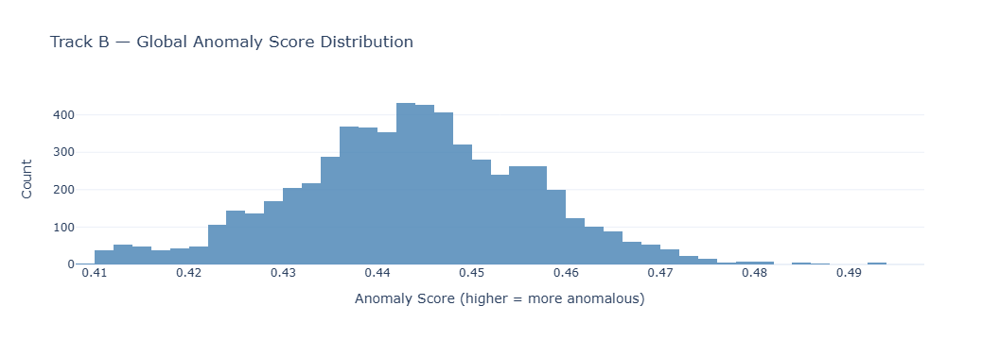

In [82]:
# ── Track B: Global IsolationForest ─────────────────────────────────────────
iso_global = IsolationForest(
    n_estimators=200,
    contamination="auto",
    random_state=SEED
)
iso_global.fit(X_encoded)

# Negate so HIGHER values = MORE anomalous
score_B = -iso_global.score_samples(X_encoded)
df["score_B"] = score_B

print("✅ Track B (Global IsolationForest) complete.")
print(f"   score_B — min: {score_B.min():.4f}  "
      f"mean: {score_B.mean():.4f}  "
      f"max:  {score_B.max():.4f}")

# ── Distribution plot ────────────────────────────────────────────────────────
fig = go.Figure(go.Histogram(
    x=score_B, nbinsx=60,
    marker_color="steelblue", opacity=0.8
))
fig.update_layout(
    title="Track B — Global Anomaly Score Distribution",
    xaxis_title="Anomaly Score (higher = more anomalous)",
    yaxis_title="Count",
    template="plotly_white", height=380
)
fig.show()

✅ Optimal k = 3  (silhouette = 0.2519)


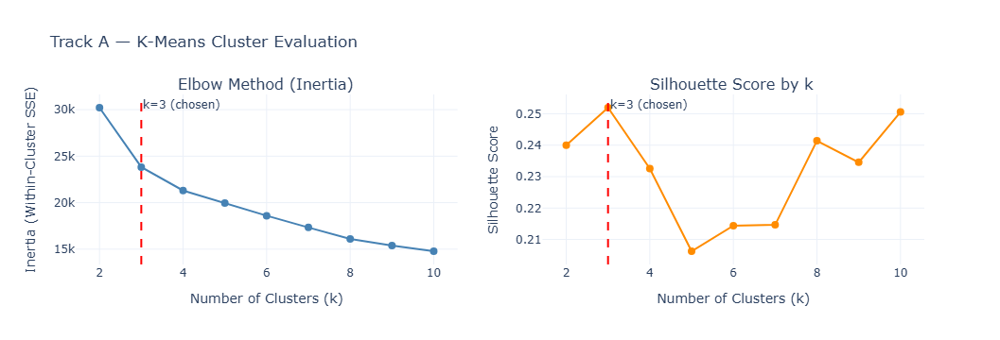

In [88]:
# ── Sweep k = 2 … 10 ─────────────────────────────────────────────────────────
k_range           = list(range(2, 11))
inertias          = []
silhouette_scores = []

for k in k_range:
    km = KMeans(n_clusters=k, init="k-means++", n_init=10, random_state=SEED)
    km.fit(X_encoded)
    inertias.append(km.inertia_)
    silhouette_scores.append(silhouette_score(X_encoded, km.labels_))

optimal_k = k_range[int(np.argmax(silhouette_scores))]
print(f"✅ Optimal k = {optimal_k}  (silhouette = {max(silhouette_scores):.4f})")

# ── Elbow + Silhouette plot ───────────────────────────────────────────────────
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("Elbow Method (Inertia)", "Silhouette Score by k")
)

fig.add_trace(
    go.Scatter(x=k_range, y=inertias, mode="lines+markers",
               marker=dict(color="steelblue", size=8),
               line=dict(color="steelblue", width=2), name="Inertia"),
    row=1, col=1
)
fig.add_vline(x=optimal_k, line_dash="dash", line_color="red",
              annotation_text=f"k={optimal_k} (chosen)",
              annotation_position="top right", row=1, col=1)

fig.add_trace(
    go.Scatter(x=k_range, y=silhouette_scores, mode="lines+markers",
               marker=dict(color="darkorange", size=8),
               line=dict(color="darkorange", width=2), name="Silhouette"),
    row=1, col=2
)
fig.add_vline(x=optimal_k, line_dash="dash", line_color="red",
              annotation_text=f"k={optimal_k} (chosen)",
              annotation_position="top right", row=1, col=2)

fig.update_xaxes(title_text="Number of Clusters (k)")
fig.update_yaxes(title_text="Inertia (Within-Cluster SSE)", row=1, col=1)
fig.update_yaxes(title_text="Silhouette Score",             row=1, col=2)
fig.update_layout(title="Track A — K-Means Cluster Evaluation",
                  template="plotly_white", height=450, showlegend=False)
fig.show()

Cluster sizes:
   Cluster 0: 1,699 patients  ✅
   Cluster 1: 3,166 patients  ✅
   Cluster 2: 1,135 patients  ✅


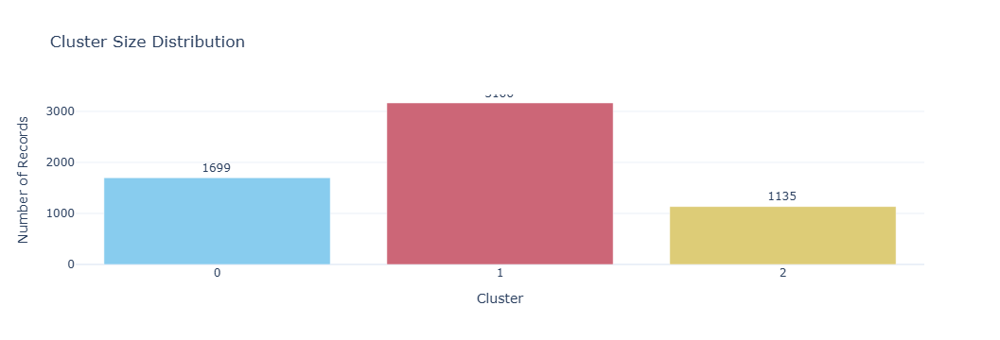

In [90]:
MIN_CLUSTER_SIZE = 100   # clusters smaller than this fall back to score_B

kmeans_final = KMeans(
    n_clusters=optimal_k, init="k-means++",
    n_init=10, random_state=SEED
)
df["cluster"] = kmeans_final.fit_predict(X_encoded).astype(str)

cluster_counts = df["cluster"].value_counts().sort_index()
print("Cluster sizes:")
for c, n in cluster_counts.items():
    tag = "⚠️  too small → will use score_B" if n < MIN_CLUSTER_SIZE else "✅"
    print(f"   Cluster {c}: {n:>5,} patients  {tag}")

# ── Bar chart ────────────────────────────────────────────────────────────────
palette = px.colors.qualitative.Safe
fig = go.Figure(go.Bar(
    x=cluster_counts.index,
    y=cluster_counts.values,
    text=cluster_counts.values,
    textposition="outside",
    marker_color=palette[:len(cluster_counts)]
))
fig.update_layout(
    title="Cluster Size Distribution",
    xaxis_title="Cluster", yaxis_title="Number of Records",
    template="plotly_white", height=400
)
fig.show()

In [92]:
score_A = np.full(len(df), np.nan)

for cluster_id in sorted(df["cluster"].unique()):
    mask = (df["cluster"] == cluster_id).values
    n    = mask.sum()

    if n < MIN_CLUSTER_SIZE:
        # Too small — borrow global score
        score_A[mask] = score_B[mask]
        print(f"   Cluster {cluster_id}: {n:>5,} rows  → fallback to score_B")
    else:
        # Dedicated IsolationForest
        X_cluster = X_encoded[mask]
        iso_local = IsolationForest(
            n_estimators=200,
            contamination="auto",
            random_state=SEED
        )
        iso_local.fit(X_cluster)
        score_A[mask] = -iso_local.score_samples(X_cluster)
        print(f"   Cluster {cluster_id}: {n:>5,} rows  → dedicated IsolationForest fitted")

df["score_A"] = score_A

print()
print("✅ Track A (Clustered IsolationForest) complete.")
print(f"   score_A — min: {score_A.min():.4f}  "
      f"mean: {score_A.mean():.4f}  "
      f"max:  {score_A.max():.4f}")

   Cluster 0: 1,699 rows  → dedicated IsolationForest fitted
   Cluster 1: 3,166 rows  → dedicated IsolationForest fitted
   Cluster 2: 1,135 rows  → dedicated IsolationForest fitted

✅ Track A (Clustered IsolationForest) complete.
   score_A — min: 0.3821  mean: 0.4677  max:  0.6429


In [94]:
# R1: charge z-score > 3 within cluster
df["charge_zscore_cluster"] = (
    df.groupby("cluster")["charge_amount_USD"]
      .transform(lambda x: (x - x.mean()) / x.std(ddof=0))
)
df["R1_high_charge"] = df["charge_zscore_cluster"] > 3

# R2: Paid claim + zero payment collected
df["R2_paid_zero_collected"] = (
    (df["claim_status"].str.lower() == "paid") &
    (df["payment_amount_USD"] == 0)
)

# R3: Paid claim + collected < 50% of charge
df["R3_underpaid"] = (
    (df["claim_status"].str.lower() == "paid") &
    (df["payment_amount_USD"] < 0.5 * df["charge_amount_USD"])
)

# R4: Denied claim + payment > 0
df["R4_denied_with_payment"] = (
    (df["claim_status"].str.lower() == "denied") &
    (df["payment_amount_USD"] > 0)
)

# flag_C = any rule fired
rule_cols = ["R1_high_charge", "R2_paid_zero_collected",
             "R3_underpaid",   "R4_denied_with_payment"]
df["flag_C"] = df[rule_cols].any(axis=1)

print("✅ Track C (Business Rules) complete.")
print()
for r in rule_cols:
    print(f"   {r:<30}: {df[r].sum():>5,} hits")
print(f"   {'flag_C (any rule)':<30}: {df['flag_C'].sum():>5,} total flagged")

✅ Track C (Business Rules) complete.

   R1_high_charge                :    24 hits
   R2_paid_zero_collected        :     0 hits
   R3_underpaid                  :     0 hits
   R4_denied_with_payment        :    25 hits
   flag_C (any rule)             :    45 total flagged


  STAGE 5 — ADAPTIVE THRESHOLDS
  threshold_A (99th pct) = 0.5910
  threshold_B (99th pct) = 0.4731


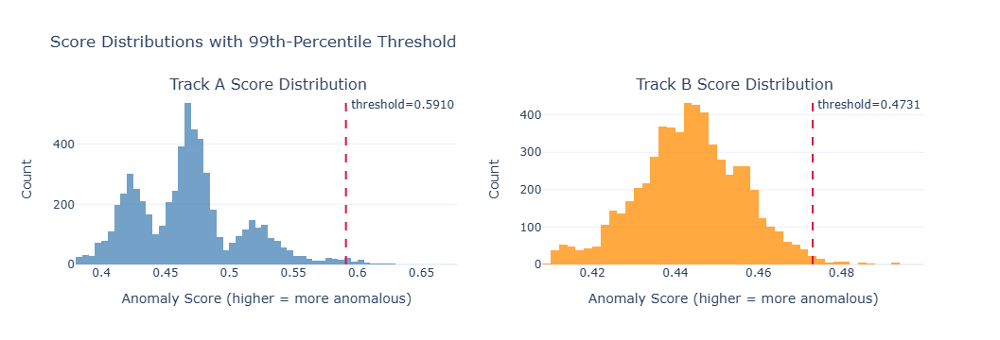

In [96]:
PERCENTILE = 99

threshold_A = np.percentile(df["score_A"], PERCENTILE)
threshold_B = np.percentile(df["score_B"], PERCENTILE)

print("=" * 50)
print("  STAGE 5 — ADAPTIVE THRESHOLDS")
print("=" * 50)
print(f"  threshold_A ({PERCENTILE}th pct) = {threshold_A:.4f}")
print(f"  threshold_B ({PERCENTILE}th pct) = {threshold_B:.4f}")
print("=" * 50)

# ── Score distribution plots with threshold lines ────────────────────────────
fig = make_subplots(rows=1, cols=2,
                    subplot_titles=("Track A Score Distribution",
                                    "Track B Score Distribution"))

for col, idx, thr, color in [
    ("score_A", (1,1), threshold_A, "steelblue"),
    ("score_B", (1,2), threshold_B, "darkorange")
]:
    fig.add_trace(
        go.Histogram(x=df[col], nbinsx=60,
                     marker_color=color, opacity=0.75, name=col),
        row=idx[0], col=idx[1]
    )
    fig.add_vline(x=thr, line_dash="dash", line_color="crimson",
                  annotation_text=f"threshold={thr:.4f}",
                  annotation_position="top right",
                  row=idx[0], col=idx[1])

fig.update_xaxes(title_text="Anomaly Score (higher = more anomalous)")
fig.update_yaxes(title_text="Count")
fig.update_layout(
    title="Score Distributions with 99th-Percentile Threshold",
    template="plotly_white", height=420, showlegend=False
)
fig.show()

In [98]:
# ── Binary flags ─────────────────────────────────────────────────────────────
df["flag_A"] = df["score_A"] >= threshold_A
df["flag_B"] = df["score_B"] >= threshold_B
# flag_C already set in Cell 7

# ── Signal count ─────────────────────────────────────────────────────────────
df["n_signals"] = df[["flag_A", "flag_B", "flag_C"]].sum(axis=1).astype(int)

# ── Tier mapping ─────────────────────────────────────────────────────────────
df["tier"] = df["n_signals"].map({3: "Tier 3", 2: "Tier 2",
                                   1: "Tier 1", 0: "Tier 0"})

# ── Summary table ────────────────────────────────────────────────────────────
tier_summary = (
    df["tier"].value_counts()
      .reindex(["Tier 3", "Tier 2", "Tier 1", "Tier 0"])
      .reset_index()
)
tier_summary.columns = ["Tier", "Count"]
tier_summary["Pct"]    = (tier_summary["Count"] / len(df) * 100).round(2)
tier_summary["Action"] = ["Investigate immediately", "Schedule review",
                           "Monitor", "Normal"]

print("=" * 60)
print("  STAGE 6 — TIER ASSIGNMENT RESULTS")
print("=" * 60)
print(f"  {'Tier':<10} {'Count':>8}  {'Pct':>7}   Action")
print("-" * 60)
for _, row in tier_summary.iterrows():
    print(f"  {row['Tier']:<10} {row['Count']:>8,}  {row['Pct']:>6.2f}%   {row['Action']}")
print("=" * 60)

  STAGE 6 — TIER ASSIGNMENT RESULTS
  Tier          Count      Pct   Action
------------------------------------------------------------
  Tier 3            1    0.02%   Investigate immediately
  Tier 2           18    0.30%   Schedule review
  Tier 1          127    2.12%   Monitor
  Tier 0        5,854   97.57%   Normal


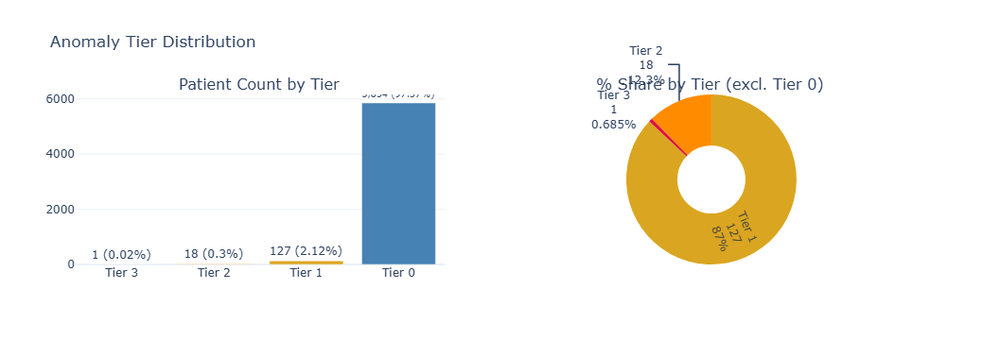

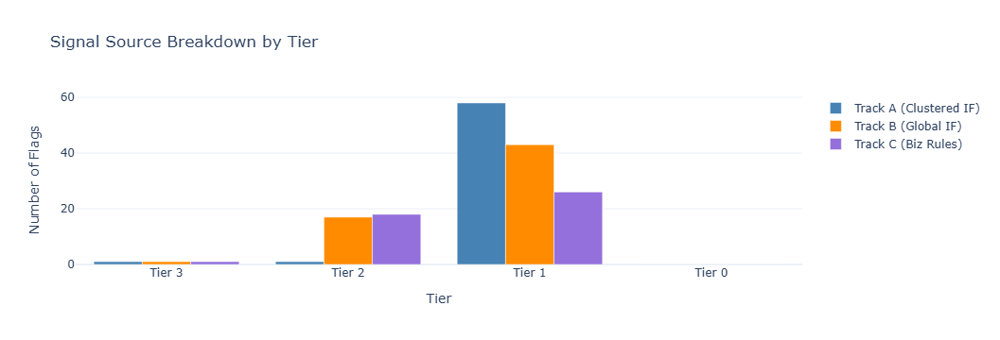

In [100]:
tier_colors   = {"Tier 3": "crimson", "Tier 2": "darkorange",
                 "Tier 1": "goldenrod", "Tier 0": "steelblue"}
ordered_tiers = ["Tier 3", "Tier 2", "Tier 1", "Tier 0"]

fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("Patient Count by Tier", "% Share by Tier (excl. Tier 0)"),
    specs=[[{"type": "bar"}, {"type": "pie"}]]
)

for _, row in tier_summary.iterrows():
    fig.add_trace(
        go.Bar(x=[row["Tier"]], y=[row["Count"]],
               name=row["Tier"],
               marker_color=tier_colors[row["Tier"]],
               text=[f"{row['Count']:,}\n({row['Pct']}%)"],
               textposition="outside"),
        row=1, col=1
    )

flagged = tier_summary[tier_summary["Tier"] != "Tier 0"]
fig.add_trace(
    go.Pie(labels=flagged["Tier"], values=flagged["Count"],
           marker_colors=[tier_colors[t] for t in flagged["Tier"]],
           hole=0.4, textinfo="label+percent+value"),
    row=1, col=2
)
fig.update_layout(title="Anomaly Tier Distribution",
                  template="plotly_white", height=450, showlegend=False)
fig.show()

# ── Signal source breakdown by tier ─────────────────────────────────────────
flag_by_tier = (
    df.groupby("tier")[["flag_A", "flag_B", "flag_C"]]
      .sum().reindex(ordered_tiers).reset_index()
)
fig2 = go.Figure()
for f, label, color in [
    ("flag_A", "Track A (Clustered IF)", "steelblue"),
    ("flag_B", "Track B (Global IF)",    "darkorange"),
    ("flag_C", "Track C (Biz Rules)",    "mediumpurple")
]:
    fig2.add_trace(go.Bar(x=flag_by_tier["tier"], y=flag_by_tier[f],
                          name=label, marker_color=color))
fig2.update_layout(title="Signal Source Breakdown by Tier",
                   xaxis_title="Tier", yaxis_title="Number of Flags",
                   barmode="group", template="plotly_white", height=420)
fig2.show()

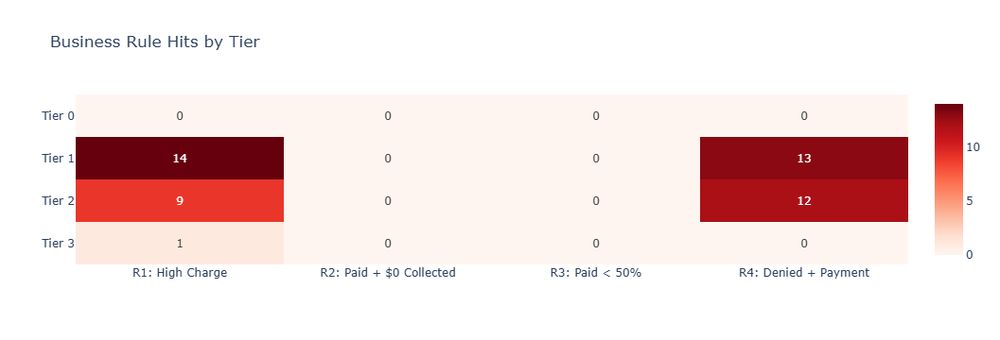

In [102]:
rule_by_tier = (
    df.groupby("tier")[rule_cols]
      .sum()
      .reindex(ordered_tiers)
)

fig = go.Figure(go.Heatmap(
    z=rule_by_tier.values,
    x=["R1: High Charge", "R2: Paid + $0 Collected",
       "R3: Paid < 50%",  "R4: Denied + Payment"],
    y=rule_by_tier.index.tolist(),
    colorscale="Reds",
    text=rule_by_tier.values,
    texttemplate="%{text}",
    showscale=True
))
fig.update_layout(title="Business Rule Hits by Tier",
                  template="plotly_white", height=380)
fig.show()

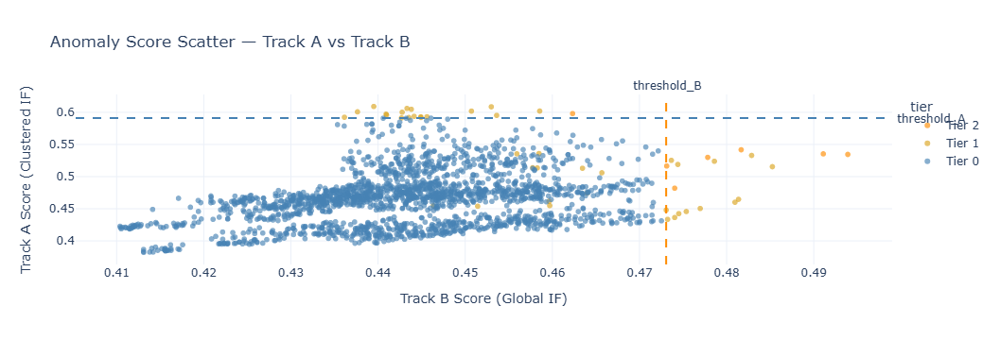

In [104]:
sample = df.sample(min(2000, len(df)), random_state=SEED)

fig = px.scatter(
    sample,
    x="score_B", y="score_A",
    color="tier",
    color_discrete_map=tier_colors,
    category_orders={"tier": ordered_tiers},
    hover_data=["cluster", "n_signals", "charge_amount_USD", "payment_amount_USD"],
    title="Anomaly Score Scatter — Track A vs Track B",
    labels={"score_B": "Track B Score (Global IF)",
            "score_A": "Track A Score (Clustered IF)"},
    opacity=0.65
)
fig.add_hline(y=threshold_A, line_dash="dash", line_color="steelblue",
              annotation_text="threshold_A", annotation_position="right")
fig.add_vline(x=threshold_B, line_dash="dash", line_color="darkorange",
              annotation_text="threshold_B", annotation_position="top")
fig.update_layout(template="plotly_white", height=520)
fig.show()

In [106]:
priority_cols = (
    ["tier", "n_signals", "score_A", "score_B"]
    + rule_cols
    + ["cluster", "flag_A", "flag_B", "flag_C"]
    + ALL_FEATURES
)

flagged_df = (
    df[df["tier"].isin(["Tier 3", "Tier 2"])]
      .sort_values(["tier", "score_A"], ascending=[True, False])
      [[c for c in priority_cols if c in df.columns]]
      .reset_index(drop=True)
)

print(f"Priority review queue: {len(flagged_df):,} patients")
print(f"  Tier 3 (immediate): {(flagged_df['tier']=='Tier 3').sum():,}")
print(f"  Tier 2 (scheduled): {(flagged_df['tier']=='Tier 2').sum():,}")

flagged_df.to_csv("priority_review_queue.csv", index=False)
print("✅ Exported to 'priority_review_queue.csv'")
flagged_df.head(10)

Priority review queue: 19 patients
  Tier 3 (immediate): 1
  Tier 2 (scheduled): 18
✅ Exported to 'priority_review_queue.csv'


,tier,n_signals,score_A,score_B,R1_high_charge,R2_paid_zero_collected,R3_underpaid,R4_denied_with_payment,cluster,flag_A,flag_B,flag_C,department,diagnosis,visit_reason,claim_status,age,payment_amount_USD,charge_amount_USD
0,Tier 2,2,0.598011,0.462324,True,False,False,True,2,True,False,True,Pediatrics,Infection,Vaccination,Denied,1,384,480
1,Tier 2,2,0.560812,0.480805,True,False,False,False,0,False,True,True,Oncology,Leukemia,Blood test,Approved,80,6824,8530
2,Tier 2,2,0.542137,0.495412,False,False,False,True,0,False,True,True,Cardiology,Heart Failure,Heart Screening,Denied,55,2320,2900
3,Tier 2,2,0.541768,0.481671,True,False,False,False,0,False,True,True,Oncology,Melanoma,Chemo,Submitted,22,9504,11880
4,Tier 2,2,0.538958,0.496234,False,False,False,True,0,False,True,True,Orthopedics,Arthritis,Surgery Follow-up,Denied,22,1312,1640
5,Tier 2,2,0.537469,0.478919,True,False,False,True,0,False,True,True,Oncology,Melanoma,Chemo,Denied,26,9552,11940
6,Tier 2,2,0.536532,0.481322,False,False,False,True,0,False,True,True,Cardiology,Hypertension,Heart Screening,Denied,49,2336,2920
7,Tier 2,2,0.535342,0.491090,False,False,False,True,0,False,True,True,Orthopedics,Arthritis,Surgery Follow-up,Denied,66,968,1210
8,Tier 2,2,0.534503,0.493901,False,False,False,True,0,False,True,True,Orthopedics,Arthritis,Surgery Follow-up,Denied,26,1184,1480
9,Tier 2,2,0.531092,0.481235,False,False,False,True,0,False,True,True,Orthopedics,Fracture,Joint Pain,Denied,21,1176,1470


In [108]:
total = len(df)
t3 = (df["tier"] == "Tier 3").sum()
t2 = (df["tier"] == "Tier 2").sum()
t1 = (df["tier"] == "Tier 1").sum()
t0 = (df["tier"] == "Tier 0").sum()

print()
print("╔══════════════════════════════════════════════════════╗")
print("║      ANOMALY DETECTION PIPELINE — FINAL SUMMARY     ║")
print("╠══════════════════════════════════════════════════════╣")
print(f"║  Total patients processed : {total:>8,}               ║")
print("║                                                      ║")
print("║  TRACK B (Global IF)                                 ║")
print(f"║    threshold_B            : {threshold_B:>10.4f}               ║")
print(f"║    Flagged                : {df['flag_B'].sum():>8,}               ║")
print("║                                                      ║")
print("║  TRACK A (Clustered IF)                              ║")
print(f"║    Optimal k              : {optimal_k:>10}               ║")
print(f"║    threshold_A            : {threshold_A:>10.4f}               ║")
print(f"║    Flagged                : {df['flag_A'].sum():>8,}               ║")
print("║                                                      ║")
print("║  TRACK C (Business Rules)                            ║")
print(f"║    Flagged                : {df['flag_C'].sum():>8,}               ║")
print("║                                                      ║")
print("║  TIER RESULTS                                        ║")
print(f"║    Tier 3 — Investigate immediately : {t3:>4,}  ({t3/total*100:.2f}%)  ║")
print(f"║    Tier 2 — Schedule review         : {t2:>4,}  ({t2/total*100:.2f}%)  ║")
print(f"║    Tier 1 — Monitor                 : {t1:>4,}  ({t1/total*100:.2f}%)  ║")
print(f"║    Tier 0 — Normal                  : {t0:>4,} ({t0/total*100:.2f}%)  ║")
print("╚══════════════════════════════════════════════════════╝")


╔══════════════════════════════════════════════════════╗
║      ANOMALY DETECTION PIPELINE — FINAL SUMMARY     ║
╠══════════════════════════════════════════════════════╣
║  Total patients processed :    6,000               ║
║                                                      ║
║  TRACK B (Global IF)                                 ║
║    threshold_B            :     0.4731               ║
║    Flagged                :       61               ║
║                                                      ║
║  TRACK A (Clustered IF)                              ║
║    Optimal k              :          3               ║
║    threshold_A            :     0.5910               ║
║    Flagged                :       60               ║
║                                                      ║
║  TRACK C (Business Rules)                            ║
║    Flagged                :       45               ║
║                                                      ║
║  TIER RESULTS                        

In [ ]:
# df[numerical_cols].info()

In [ ]:
# df[categorical_cols].info()

In [ ]:
# # Preprocessing for categorical features
# preprocessor = ColumnTransformer(
#     transformers=[
#         ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), categorical_cols)
#     ],
#     remainder='passthrough'  # numerical columns stay as-is
# )

# # Build pipeline
# pipeline = Pipeline([
#     ('preprocess', preprocessor),
#     ('anomaly_detector', IsolationForest(
#         n_estimators=100, contamination=0.01, random_state=42))
# ])

# # Fit the pipeline on the selected columns
# pipeline.fit(df[numerical_cols + categorical_cols])

# # Predict anomalies (-1 = anomaly, 1 = normal)
# df['anomaly'] = pipeline.predict(df[numerical_cols + categorical_cols])

# # Inspect anomalies
# print(df['anomaly'].value_counts())


In [ ]:
# (df[numerical_cols + categorical_cols])

**How can we ensure that an Isolation Forest model is functioning correctly when we don’t have a clear evaluation metric?**

**Which statistical or analytical methods can help reduce errors from a business perspective?**

**If the model is deployed without proper validation, what could happen when data drift or changes in variable distributions occur over time?**

**How can we penalize errors caused by drift or variability changes during deployment, and what actions should be taken to handle them?**

**Can you list any analytical or monitoring methods that can address these issues effectively?**

**What’s the impact of deploying a model without proper evaluation or validation?**

**How do we monitor deployed models for both performance degradation and business KPIs?**

**Which analytic methods or dashboards are effective for post-deployment monitoring?**

**How do we communicate model uncertainty and limitations to non-technical stakeholders?**

In [ ]:
## verify the anomaly detection for

In [ ]:
# import plotly.graph_objects as go
# import pandas as pd

# # Aggregate average charge per department
# dept_charge = df.groupby('department')['charge_amount_USD'].mean().sort_values()
# departments = dept_charge.index
# avg_charges = dept_charge.values

# # Create figure
# fig = go.Figure()

# # Add bar plot for average charge
# fig.add_trace(go.Bar(
#     x=departments,
#     y=avg_charges,
#     name='Average Charge',
#     marker_color='skyblue',
#     opacity=0.6
# ))

# # Add boxplot for distribution per department
# for dept in departments:
#     fig.add_trace(go.Box(
#         y=df[df['department'] == dept]['charge_amount_USD'],
#         x=[dept]*len(df[df['department'] == dept]),
#         name=dept,
#         boxpoints='outliers',  # show outliers
#         marker_color='red',
#         line=dict(color='red'),
#         opacity=0.5,
#         showlegend=False  # hide duplicate legend entries
#     ))

# # Update layout
# fig.update_layout(
#     title='Charge Amount per Department with Boxplot (Identify Anomalies)',
#     yaxis_title='Charge Amount (USD)',
#     xaxis_title='Department',
#     xaxis_tickangle=-45,
#     template='plotly_white',
#     width=1200,
#     height=600
# )

# fig.show()


In [ ]:
## For Oncology the upper fence is 1199 USD 
## when we filter the anomaly detected value 

In [ ]:
# # Filter only anomalies detected by Isolation Forest
# anomalies = df[df['anomaly'] == -1]

# # If you want to filter by a specific department, e.g., "Oncology"
# dept_anomalies = anomalies[anomalies['department'] == 'Oncology']

# # Filter anomalies in a specific department with charge_amount_USD < 300
# dept_anomalies_filtered = dept_anomalies[dept_anomalies['charge_amount_USD'] < 1000]

# # Select only specific columns to view
# dept_anomalies_filtered[['department','charge_amount_USD','anomaly']]


In [ ]:
## For Cardiology the upper fence is 300 USD 
## when we filter the anomaly detected value 

In [ ]:
# # Filter only anomalies detected by Isolation Forest
# anomalies = df[df['anomaly'] == -1]

# # If you want to filter by a specific department, e.g., "Cardiology"
# dept_anomalies = anomalies[anomalies['department'] == 'Cardiology']

# # Filter anomalies in a specific department with charge_amount_USD < 300
# dept_anomalies_filtered = dept_anomalies[dept_anomalies['charge_amount_USD'] < 300]

# # Select only specific columns to view
# dept_anomalies_filtered[['department','charge_amount_USD','anomaly']]


In [ ]:
## For Orthopedics the upper fence is 200 USD 
## when we filter the anomaly detected value 

In [ ]:
# # Filter only anomalies detected by Isolation Forest
# anomalies = df[df['anomaly'] == -1]

# # If you want to filter by a specific department, e.g., "Orthopedics"
# dept_anomalies = anomalies[anomalies['department'] == 'Orthopedics']

# # Filter anomalies in a specific department with charge_amount_USD < 200
# dept_anomalies_filtered = dept_anomalies[dept_anomalies['charge_amount_USD'] < 200]

# # Select only specific columns to view
# dept_anomalies_filtered[['department','charge_amount_USD','anomaly']]


In [ ]:
## For Neurology the upper fence is 200 USD 
## when we filter the anomaly detected value 

In [ ]:
# # Filter only anomalies detected by Isolation Forest
# anomalies = df[df['anomaly'] == -1]

# # If you want to filter by a specific department, e.g., "Neurology"
# dept_anomalies = anomalies[anomalies['department'] == 'Neurology']

# # Filter anomalies in a specific department with charge_amount_USD < 200
# dept_anomalies_filtered = dept_anomalies[dept_anomalies['charge_amount_USD'] < 200]

# # Select only specific columns to view
# dept_anomalies_filtered[['department','charge_amount_USD','anomaly']]


In [ ]:
## For pediatrics the upper fence is 80 USD 
## when we filter the anomaly detected value 

In [ ]:
# # Filter only anomalies detected by Isolation Forest
# anomalies = df[df['anomaly'] == -1]

# # If you want to filter by a specific department, e.g., "pediatrics"
# dept_anomalies = anomalies[anomalies['department'] == 'pediatrics']

# # Filter anomalies in a specific department with charge_amount_USD < 200
# dept_anomalies_filtered = dept_anomalies[dept_anomalies['charge_amount_USD'] < 200]

# # Select only specific columns to view
# dept_anomalies_filtered[['department','charge_amount_USD','anomaly']]


In [ ]:
## check for the patient Diagnosis with anomaly 

In [ ]:
# import plotly.graph_objects as go
# import pandas as pd

# # Get unique diagnosis categories
# departments = sorted(df['diagnosis'].unique())

# # Create figure
# fig = go.Figure()

# # Add only boxplots for each diagnosis (without average bar plot)
# for dept in departments:
#     fig.add_trace(go.Box(
#         y=df[df['diagnosis'] == dept]['charge_amount_USD'],
#         name=dept,
#         boxpoints='outliers',   # show outliers
#         marker_color='red',
#         line=dict(color='red'),
#         opacity=0.6,
#         showlegend=False
#     ))

# # Update layout
# fig.update_layout(
#     title='Charge Amount per Diagnosis with Boxplot (Identify Anomalies)',
#     yaxis_title='Charge Amount (USD)',
#     xaxis_title='Diagnosis',
#     xaxis_tickangle=-45,
#     template='plotly_white',
#     width=1200,
#     height=600
# )

# fig.show()

In [ ]:
# # Filter only anomalies detected by Isolation Forest
# anomalies = df[df['anomaly'] == -1]

# # If you want to filter by a specific department, e.g., "Arrhythmia"
# dept_anomalies = anomalies[anomalies['diagnosis'] == 'Arrhythmia']

# # Filter anomalies in a specific department with charge_amount_USD < 200
# dept_anomalies_filtered = dept_anomalies[dept_anomalies['charge_amount_USD'] < 200]

# # Select only specific columns to view
# dept_anomalies_filtered[['diagnosis','charge_amount_USD','anomaly']]


In [ ]:
# # Filter only anomalies detected by Isolation Forest
# anomalies = df[df['anomaly'] == -1]

# # If you want to filter by a specific department, e.g., "Arthritis"
# dept_anomalies = anomalies[anomalies['diagnosis'] == 'Arthritis']

# # Filter anomalies in a specific department with charge_amount_USD < 200
# dept_anomalies_filtered = dept_anomalies[dept_anomalies['charge_amount_USD'] < 200]

# # Select only specific columns to view
# dept_anomalies_filtered[['diagnosis','charge_amount_USD','anomaly']]


In [ ]:
# # Filter only anomalies detected by Isolation Forest
# anomalies = df[df['anomaly'] == -1]

# # If you want to filter by a specific department, e.g., "Asthma"
# dept_anomalies = anomalies[anomalies['diagnosis'] == 'Asthma']

# # Filter anomalies in a specific department with charge_amount_USD < 80
# dept_anomalies_filtered = dept_anomalies[dept_anomalies['charge_amount_USD'] < 80]

# # Select only specific columns to view
# dept_anomalies_filtered[['diagnosis','charge_amount_USD','anomaly']]


In [ ]:
# # Filter only anomalies detected by Isolation Forest
# anomalies = df[df['anomaly'] == -1]

# # If you want to filter by a specific department, e.g., "Back Pain
# dept_anomalies = anomalies[anomalies['diagnosis'] == 'Back Pain']

# # Filter anomalies in a specific department with charge_amount_USD < 200
# dept_anomalies_filtered = dept_anomalies[dept_anomalies['charge_amount_USD'] < 200]

# # Select only specific columns to view
# dept_anomalies_filtered[['diagnosis','charge_amount_USD','anomaly']]


In [ ]:
# # Filter only anomalies detected by Isolation Forest
# anomalies = df[df['anomaly'] == -1]

# # If you want to filter by a specific department, e.g., "Back Pain
# dept_anomalies = anomalies[anomalies['diagnosis'] == 'Back Pain']

# # Filter anomalies in a specific department with charge_amount_USD < 1100
# dept_anomalies_filtered = dept_anomalies[dept_anomalies['charge_amount_USD'] < 1100]

# # Select only specific columns to view
# dept_anomalies_filtered[['diagnosis','charge_amount_USD','anomaly']]


In [ ]:
# # Filter only anomalies detected by Isolation Forest
# anomalies = df[df['anomaly'] == -1]

# # If you want to filter by a specific department, e.g., "Cancer
# dept_anomalies = anomalies[anomalies['diagnosis'] == 'Cancer']

# # Filter anomalies in a specific department with charge_amount_USD < 1000
# dept_anomalies_filtered = dept_anomalies[dept_anomalies['charge_amount_USD'] < 1000]

# # Select only specific columns to view
# dept_anomalies_filtered[['diagnosis','charge_amount_USD','anomaly']]


In [ ]:
# # Filter only anomalies detected by Isolation Forest
# anomalies = df[df['anomaly'] == -1]

# # If you want to filter by a specific department, e.g., "Epilepsy
# dept_anomalies = anomalies[anomalies['diagnosis'] == 'Epilepsy']

# # Filter anomalies in a specific department with charge_amount_USD < 200
# dept_anomalies_filtered = dept_anomalies[dept_anomalies['charge_amount_USD'] < 200]

# # Select only specific columns to view
# dept_anomalies_filtered[['diagnosis','charge_amount_USD','anomaly']]


In [ ]:
# # Filter only anomalies detected by Isolation Forest
# anomalies = df[df['anomaly'] == -1]

# # If you want to filter by a specific department, e.g., "Flu
# dept_anomalies = anomalies[anomalies['diagnosis'] == 'Flu']

# # Filter anomalies in a specific department with charge_amount_USD < 100
# dept_anomalies_filtered = dept_anomalies[dept_anomalies['charge_amount_USD'] < 100]

# # Select only specific columns to view
# dept_anomalies_filtered[['diagnosis','charge_amount_USD','anomaly']]


In [ ]:
# # Filter only anomalies detected by Isolation Forest
# anomalies = df[df['anomaly'] == -1]

# # If you want to filter by a specific department, e.g., "Fracture
# dept_anomalies = anomalies[anomalies['diagnosis'] == 'Fracture']

# # Filter anomalies in a specific department with charge_amount_USD < 200
# dept_anomalies_filtered = dept_anomalies[dept_anomalies['charge_amount_USD'] < 200]

# # Select only specific columns to view
# dept_anomalies_filtered[['diagnosis','charge_amount_USD','anomaly']]


In [ ]:
# # Filter only anomalies detected by Isolation Forest
# anomalies = df[df['anomaly'] == -1]

# # If you want to filter by a specific department, e.g., "'Heart Failure'
# dept_anomalies = anomalies[anomalies['diagnosis'] == 'Heart Failure']

# # Filter anomalies in a specific department with charge_amount_USD < 300
# dept_anomalies_filtered = dept_anomalies[dept_anomalies['charge_amount_USD'] < 300]

# # Select only specific columns to view
# dept_anomalies_filtered[['diagnosis','charge_amount_USD','anomaly']]


In [ ]:
# # Filter only anomalies detected by Isolation Forest
# anomalies = df[df['anomaly'] == -1]

# # If you want to filter by a specific department, e.g., "'Heart Failure'
# dept_anomalies = anomalies[anomalies['diagnosis'] == 'Hypertension']

# # Filter anomalies in a specific department with charge_amount_USD < 300
# dept_anomalies_filtered = dept_anomalies[dept_anomalies['charge_amount_USD'] < 300]

# # Select only specific columns to view
# dept_anomalies_filtered[['diagnosis','charge_amount_USD','anomaly']]


In [ ]:
# # Filter only anomalies detected by Isolation Forest
# anomalies = df[df['anomaly'] == -1]

# # If you want to filter by a specific department, e.g., "Infection
# dept_anomalies = anomalies[anomalies['diagnosis'] == 'Infection']

# # Filter anomalies in a specific department with charge_amount_USD < 100
# dept_anomalies_filtered = dept_anomalies[dept_anomalies['charge_amount_USD'] < 100]

# # Select only specific columns to view
# dept_anomalies_filtered[['diagnosis','charge_amount_USD','anomaly']]


In [ ]:
# # Filter only anomalies detected by Isolation Forest
# anomalies = df[df['anomaly'] == -1]

# # If you want to filter by a specific department, e.g., "Infection
# dept_anomalies = anomalies[anomalies['diagnosis'] == 'Infection']

# # Filter anomalies in a specific department with charge_amount_USD < 100
# dept_anomalies_filtered = dept_anomalies[dept_anomalies['charge_amount_USD'] < 100]

# # Select only specific columns to view
# dept_anomalies_filtered[['diagnosis','charge_amount_USD','anomaly']]


In [ ]:
# # Filter only anomalies detected by Isolation Forest
# anomalies = df[df['anomaly'] == -1]

# # If you want to filter by a specific department, e.g., "Leukemia
# dept_anomalies = anomalies[anomalies['diagnosis'] == 'Leukemia']

# # Filter anomalies in a specific department with charge_amount_USD < 1000
# dept_anomalies_filtered = dept_anomalies[dept_anomalies['charge_amount_USD'] < 1000]

# # Select only specific columns to view
# dept_anomalies_filtered[['diagnosis','charge_amount_USD','anomaly']]


In [ ]:
# # Filter only anomalies detected by Isolation Forest
# anomalies = df[df['anomaly'] == -1]

# # If you want to filter by a specific department, e.g., "Lymphoma
# dept_anomalies = anomalies[anomalies['diagnosis'] == 'Lymphoma']

# # Filter anomalies in a specific department with charge_amount_USD < 1000
# dept_anomalies_filtered = dept_anomalies[dept_anomalies['charge_amount_USD'] < 1000]

# # Select only specific columns to view
# dept_anomalies_filtered[['diagnosis','charge_amount_USD','anomaly']]

In [ ]:
# # Filter only anomalies detected by Isolation Forest
# anomalies = df[df['anomaly'] == -1]

# # If you want to filter by a specific department, e.g., "Melanoma
# dept_anomalies = anomalies[anomalies['diagnosis'] == 'Melanoma']

# # Filter anomalies in a specific department with charge_amount_USD < 1000
# dept_anomalies_filtered = dept_anomalies[dept_anomalies['charge_amount_USD'] < 1000]

# # Select only specific columns to view
# dept_anomalies_filtered[['diagnosis','charge_amount_USD','anomaly']]

In [ ]:
# # Filter only anomalies detected by Isolation Forest
# anomalies = df[df['anomaly'] == -1]

# # If you want to filter by a specific department, e.g., "Migraine
# dept_anomalies = anomalies[anomalies['diagnosis'] == 'Migraine']

# # Filter anomalies in a specific department with charge_amount_USD < 100
# dept_anomalies_filtered = dept_anomalies[dept_anomalies['charge_amount_USD'] < 200]

# # Select only specific columns to view
# dept_anomalies_filtered[['diagnosis','charge_amount_USD','anomaly']]

In [ ]:
# # Filter only anomalies detected by Isolation Forest
# anomalies = df[df['anomaly'] == -1]

# # If you want to filter by a specific department, e.g., "Stroke
# dept_anomalies = anomalies[anomalies['diagnosis'] == 'Stroke']

# # Filter anomalies in a specific department with charge_amount_USD < 100
# dept_anomalies_filtered = dept_anomalies[dept_anomalies['charge_amount_USD'] < 200]

# # Select only specific columns to view
# dept_anomalies_filtered[['diagnosis','charge_amount_USD','anomaly']]